Projekt zaliczeniowy na przedmiot Wyjaśnialność modeli w uczeniu maszynowym.

Autorka: Patrycja Falęcik

# Import bibliotek i załadowanie zbioru danych

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
data = pd.read_csv("f1_strategy_dataset_v4.csv")

# Eksploracja danych

Dane pobrane ze strony kaggle.com. Autorem datasetu jest Aadi Gupta.

Link do datasetu: https://www.kaggle.com/datasets/aadigupta1601/f1-strategy-dataset-pit-stop-prediction


Cechy:
*  Year – Season of the race
* Race – Grand Prix name
* Driver – Driver code
* LapNumber – Lap index within the race
* Position – Driver’s position on that lap
* LapTime (s) – Lap time in seconds
* Stint – Tire stint number - który zestaw opon w wyścigu
* TyreLife – Number of laps on current tire
* Normalized_TyreLife – Tire life normalized within stint
* Compound_Encoded – Tire compound
* LapTime_Delta – Change in lap time from previous lap
* Cumulative_Degradation – Accumulated tire performance drop
* Position_Change – Position gain/loss compared to previous lap
* RaceProgress – Fraction of race completed (0 → 1)
* PitStop – Whether the driver pitted on that lap (0/1)
* PitNextLap – Target variable: whether the driver will pit next lap (0/1)

In [ ]:
data.head()

,Driver,LapNumber,Compound,Stint,TyreLife,Position,LapTime (s),Race,Year,LapTime_Delta,Cumulative_Degradation,PitStop,PitNextLap,RaceProgress,Normalized_TyreLife,Position_Change
0,ALB,1,MEDIUM,1,2.0,17,100.625,Abu Dhabi Grand Prix,2023,0.000,0.000,0,0,0.017241,0.117647,0.0
1,ALB,2,MEDIUM,1,3.0,18,93.560,Abu Dhabi Grand Prix,2023,-7.065,-7.065,0,0,0.034483,0.176471,-1.0
2,ALB,3,MEDIUM,1,4.0,18,91.768,Abu Dhabi Grand Prix,2023,-1.792,-8.857,0,0,0.051724,0.235294,0.0
3,ALB,4,MEDIUM,1,5.0,18,91.591,Abu Dhabi Grand Prix,2023,-0.177,-9.034,0,0,0.068966,0.294118,0.0
4,ALB,5,MEDIUM,1,6.0,18,91.422,Abu Dhabi Grand Prix,2023,-0.169,-9.203,0,0,0.086207,0.352941,0.0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101371 entries, 0 to 101370
Data columns (total 16 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Driver                  101371 non-null  object 
 1   LapNumber               101371 non-null  int64  
 2   Compound                101305 non-null  object 
 3   Stint                   101371 non-null  int64  
 4   TyreLife                101371 non-null  float64
 5   Position                101371 non-null  int64  
 6   LapTime (s)             101371 non-null  float64
 7   Race                    101371 non-null  object 
 8   Year                    101371 non-null  int64  
 9   LapTime_Delta           101371 non-null  float64
 10  Cumulative_Degradation  101371 non-null  float64
 11  PitStop                 101371 non-null  int64  
 12  PitNextLap              101371 non-null  int64  
 13  RaceProgress            101371 non-null  float64
 14  Normalized_TyreLife 

In [ ]:
data.describe()

,LapNumber,Stint,TyreLife,Position,LapTime (s),Year,LapTime_Delta,Cumulative_Degradation,PitStop,PitNextLap,RaceProgress,Normalized_TyreLife,Position_Change
count,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000,101371.000000
mean,30.444841,2.046394,14.549339,9.759132,92.587188,2023.589685,-0.203891,-29.550051,0.251581,0.254797,0.432618,0.386521,-0.004636
std,18.146942,0.948797,10.313385,5.406456,33.231414,1.098518,45.344910,70.235759,0.433924,0.435749,0.258129,0.259906,3.912725
min,1.000000,1.000000,1.000000,1.000000,67.012000,2022.000000,-2403.895000,-274.564000,0.000000,0.000000,0.012821,0.012821,-18.000000
25%,15.000000,1.000000,7.000000,5.000000,82.021000,2023.000000,-7.253000,-51.054500,0.000000,0.000000,0.210526,0.172414,-2.000000
50%,30.000000,2.000000,13.000000,10.000000,91.167000,2024.000000,-0.027000,-21.678000,0.000000,0.000000,0.421053,0.333333,0.000000
75%,45.000000,3.000000,20.000000,14.000000,99.356000,2025.000000,5.705000,-3.725500,1.000000,1.000000,0.631579,0.562500,2.000000
max,78.000000,8.000000,78.000000,20.000000,2526.253000,2025.000000,2433.472000,2412.431000,1.000000,1.000000,1.000000,1.000000,18.000000


In [ ]:
data["Race"].unique()

array(['Abu Dhabi Grand Prix', 'Australian Grand Prix',
       'Austrian Grand Prix', 'Azerbaijan Grand Prix',
       'Bahrain Grand Prix', 'Belgian Grand Prix', 'British Grand Prix',
       'Canadian Grand Prix', 'Dutch Grand Prix', 'Hungarian Grand Prix',
       'Italian Grand Prix', 'Japanese Grand Prix',
       'Las Vegas Grand Prix', 'Mexico City Grand Prix',
       'Miami Grand Prix', 'Monaco Grand Prix', 'Pre-Season Testing',
       'Qatar Grand Prix', 'Saudi Arabian Grand Prix',
       'Singapore Grand Prix', 'Spanish Grand Prix',
       'São Paulo Grand Prix', 'United States Grand Prix',
       'Chinese Grand Prix', 'Emilia Romagna Grand Prix',
       'French Grand Prix', 'Pre-Season Test', 'Pre-Season Track Session'],
      dtype=object)

In [ ]:
spa_data = data[data["Race"] == "Belgian Grand Prix"]

In [ ]:
spa_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3151 entries, 5395 to 84243
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Driver                  3151 non-null   object 
 1   LapNumber               3151 non-null   int64  
 2   Compound                3151 non-null   object 
 3   Stint                   3151 non-null   int64  
 4   TyreLife                3151 non-null   float64
 5   Position                3151 non-null   int64  
 6   LapTime (s)             3151 non-null   float64
 7   Race                    3151 non-null   object 
 8   Year                    3151 non-null   int64  
 9   LapTime_Delta           3151 non-null   float64
 10  Cumulative_Degradation  3151 non-null   float64
 11  PitStop                 3151 non-null   int64  
 12  PitNextLap              3151 non-null   int64  
 13  RaceProgress            3151 non-null   float64
 14  Normalized_TyreLife     3151 non-null   f

In [ ]:
X = spa_data.drop(columns = ["Race", "Driver", "PitNextLap", "PitStop", "Year"])
y = spa_data["PitNextLap"]

X.shape

(3151, 11)

In [ ]:
X = pd.get_dummies(X, columns=["Compound"])

In [ ]:
X.shape

(3151, 14)

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size = 0.2,
    stratify = y,
    random_state = 42
)

# Model regresji liniowej

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

model_rl = Pipeline([
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(max_iter=10000))
])

model_rl.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('model', LogisticRegression(max_iter=10000))])

In [ ]:
y_pred = model_rl.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test, y_pred)

0.8193343898573693

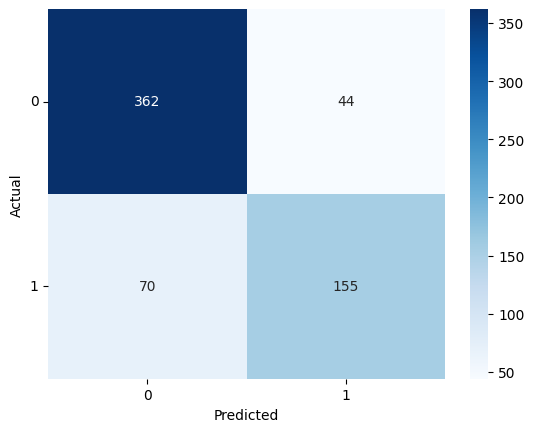

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(
    pd.DataFrame(cm),
    annot=True,       # liczby w komórkach
    fmt='d',          # format liczb (integer)
    cmap='Blues'
)

plt.yticks(rotation=0)   # etykiety osi Y pionowo
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.89      0.86       406
           1       0.78      0.69      0.73       225

    accuracy                           0.82       631
   macro avg       0.81      0.79      0.80       631
weighted avg       0.82      0.82      0.82       631



In [ ]:
from sklearn.metrics import balanced_accuracy_score

balanced_accuracy_score(y_test, y_pred)

np.float64(0.7902572523262179)

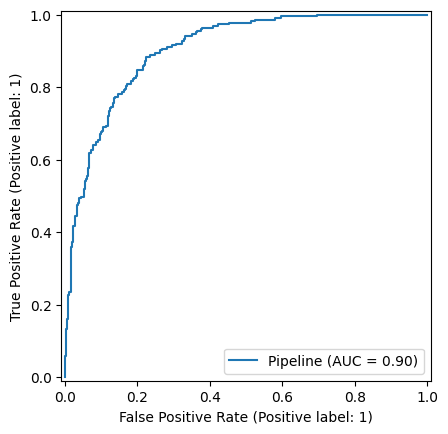

In [ ]:
from sklearn.metrics import roc_auc_score, RocCurveDisplay

roc_auc = roc_auc_score(y_test, model_rl.predict_proba(X_test)[:, 1])
RocCurveDisplay.from_estimator(model_rl, X_test, y_test)
plt.show()

Krzywa ROC ma kształt zbliżony do prostokąta, co wskazuje na bardzo dobrą zdolność modelu do rozróżniania klas. Wysoka wartość AUC oznacza, że model osiąga wysoką czułość przy jednocześnie niskim poziomie fałszywych alarmów.

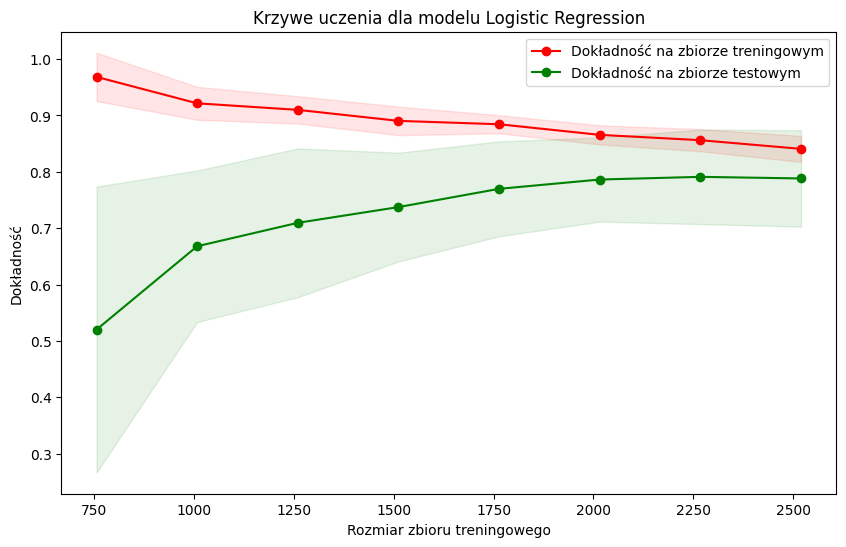

In [ ]:
from sklearn.model_selection import learning_curve

# Ustalanie krzywych uczenia
train_sizes, train_scores, test_scores = learning_curve(
    model_rl, X, y, train_sizes=np.linspace(0.1, 1.0, 10), cv=5, scoring='accuracy')

# Obliczenie średnich i odchyleń standardowych
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Wizualizacja wyników
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, 'o-', color="r", label="Dokładność na zbiorze treningowym")
plt.plot(train_sizes, test_mean, 'o-', color="g", label="Dokładność na zbiorze testowym")

# Cieniowanie obszarów odchylenia standardowego
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="r", alpha=0.1)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="g", alpha=0.1)

plt.xlabel("Rozmiar zbioru treningowego")
plt.ylabel("Dokładność")
plt.legend(loc="best")
plt.title("Krzywe uczenia dla modelu Logistic Regression")
plt.show()

Krzywe dla zbioru treningowego i testowego są blisko siebie i obie osiągają wysoką wartość przy dużych rozmiarach próbek. Wskazuje to, że model generalizuje dobrze i jest odpowiednio dopasowany.

# Walidacja krzyżowa - Stratified K-Fold

In [ ]:
def print_summary(acc_list, bacc_list, name):
    print(f"\n*** PODSUMOWANIE: {name} ***")
    print(f"Średnie Accuracy: {np.mean(acc_list):.4f}  (std={np.std(acc_list):.4f})")
    print(f"Średni Balanced Accuracy : {np.mean(bacc_list):.4f}  (std={np.std(bacc_list):.4f})")

In [ ]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

acc_list, bacc_list = [], []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
    model_rl.fit(X.iloc[train_idx], y.iloc[train_idx])
    preds = model_rl.predict(X.iloc[test_idx])

    acc = accuracy_score(y.iloc[test_idx], preds)
    bacc = balanced_accuracy_score(y.iloc[test_idx], preds)
    acc_list.append(acc)
    bacc_list.append(bacc)

    print(f"\nFold {fold}")
    print("Accuracy:", acc, "Balanced accuracy:", bacc)

print_summary(acc_list, bacc_list, "StratifiedKFold")


Fold 0
Accuracy: 0.8240887480190174 Balanced accuracy: 0.7969239189928845

Fold 1
Accuracy: 0.834920634920635 Balanced accuracy: 0.8093827160493827

Fold 2
Accuracy: 0.8365079365079365 Balanced accuracy: 0.808641975308642

Fold 3
Accuracy: 0.846031746031746 Balanced accuracy: 0.8160493827160493

Fold 4
Accuracy: 0.8095238095238095 Balanced accuracy: 0.7866666666666666

*** PODSUMOWANIE: StratifiedKFold ***
Średnie Accuracy: 0.8302  (std=0.0125)
Średni Balanced Accuracy : 0.8035  (std=0.0104)


# Współczynniki modelu

In [ ]:
model = model_rl.named_steps["model"]

coefficients = pd.Series(model.coef_[0], index=X_train.columns)

coefficients.sort_values()

,0
RaceProgress,-4.303482
Compound_INTERMEDIATE,-0.987251
LapTime (s),-0.355494
Position,-0.148837
Cumulative_Degradation,-0.106376
Position_Change,0.009696
Compound_SOFT,0.050063
LapTime_Delta,0.072908
Compound_HARD,0.155783
Compound_MEDIUM,0.305203


Które cechy są dodatnie -> zwiększają prawdopodobieństwo pit stopu

In [ ]:
coefficients[lambda x: x > 0].sort_values(ascending = False)

,0
Stint,2.219372
TyreLife,1.989357
LapNumber,1.381631
Normalized_TyreLife,0.597758
Compound_MEDIUM,0.305203
Compound_HARD,0.155783
LapTime_Delta,0.072908
Compound_SOFT,0.050063
Position_Change,0.009696


Cechy ujemne -> mniejsze prawdopodobieństwo pit stopu

In [ ]:
coefficients[lambda x: x < 0].sort_values()

,0
RaceProgress,-4.303482
Compound_INTERMEDIATE,-0.987251
LapTime (s),-0.355494
Position,-0.148837
Cumulative_Degradation,-0.106376


Skorelowanie cech między sobą

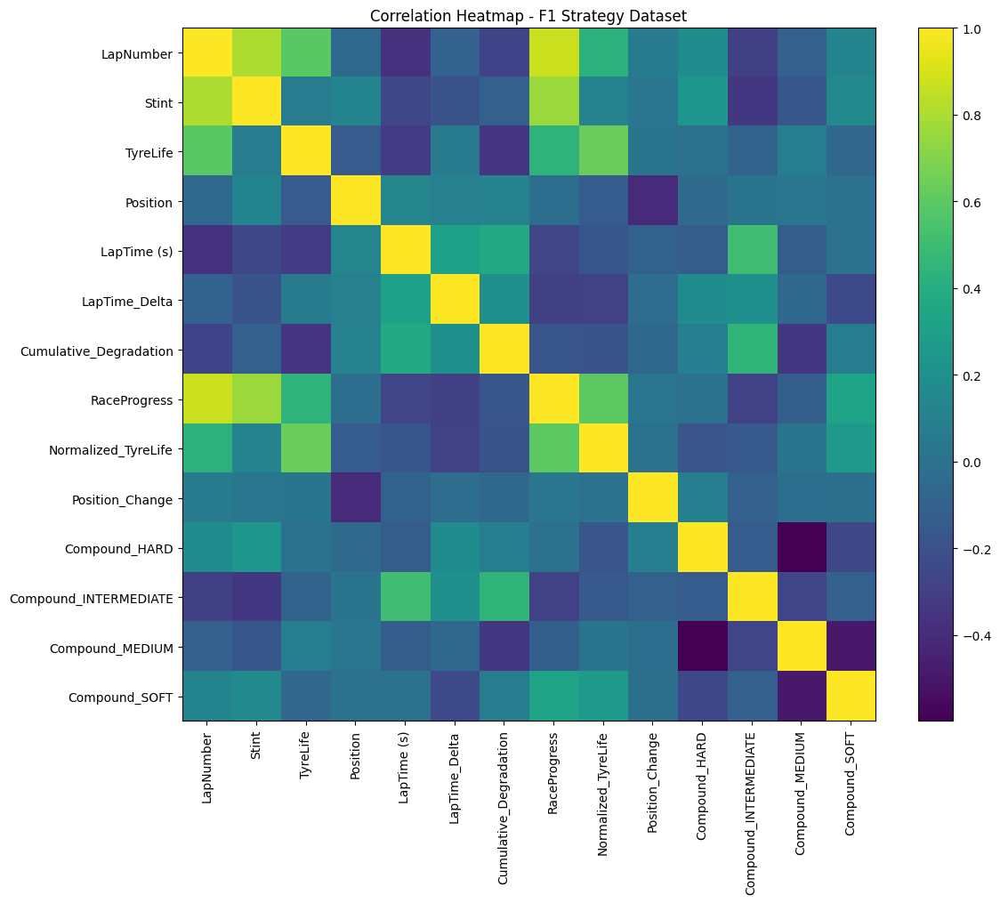

In [ ]:
# compute correlation matrix
corr = X.corr()

# plot heatmap
plt.figure(figsize=(12, 10))
plt.imshow(corr, interpolation='nearest')
plt.colorbar()

plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
plt.yticks(range(len(corr.columns)), corr.columns)

plt.title("Correlation Heatmap - F1 Strategy Dataset")
plt.tight_layout()
plt.show()

Wizualizacja wpływu cech

<Axes: >

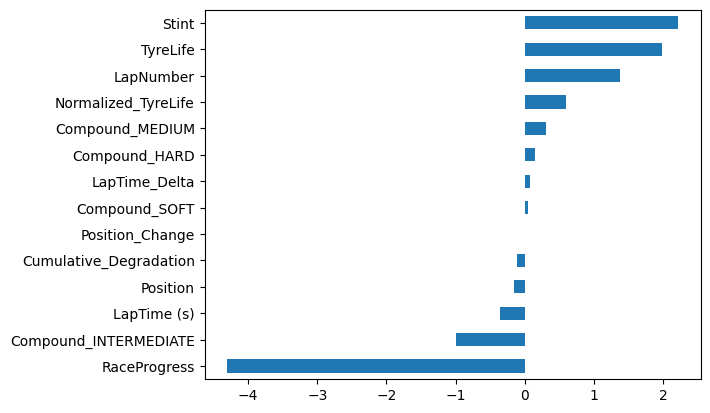

In [ ]:
coefficients.sort_values().plot.barh()

1. RaceProgress

Najsilniejsza cecha w modelu (ujemny wpływ).

Wraz ze wzrostem postępu wyścigu malało prawdopodobieństwo wykonania kolejnego pit stopu. Model nauczył się, że pod koniec wyścigu zespoły rzadziej decydują się na dodatkowy zjazd do alei serwisowej, ponieważ koszt czasowy pit stopu staje się trudniejszy do odrobienia na ograniczonej liczbie pozostałych okrążeń.

2. Stint

Najsilniejsza dodatnia cecha.

Im dłużej trwał aktualny stint kierowcy, tym większe było prawdopodobieństwo pit stopu na następnym okrążeniu. Jest to zgodne z rzeczywistą strategią F1 — długi stint zwykle oznacza rosnącą degradację opon i spadek osiągów.

3. TyreLife

Bardzo silny dodatni wpływ.

Model wykrył, że wiek opon jest jednym z głównych czynników wpływających na decyzję o pit stopie. Wraz ze wzrostem liczby okrążeń przejechanych na danym komplecie opon rosło prawdopodobieństwo zjazdu do pit lane.

4. LapNumber

Dodatni wpływ na predykcję.

Numer okrążenia wpływał na przewidywanie momentu pit stopu, ponieważ pit stopy najczęściej występują w określonych fazach wyścigu. Model nauczył się typowych „okien pit stopowych”, w których zespoły najczęściej realizują strategie wymiany opon.

5. Compound_INTERMEDIATE

Silny ujemny wpływ.

Obecność opon przejściowych zmniejszała prawdopodobieństwo pit stopu na następnym okrążeniu. Może to wynikać z faktu, że podczas warunków przejściowych zespoły często starają się wydłużać stint i unikać dodatkowych postojów ze względu na niepewne warunki pogodowe.

# Lokalne wyjaśnienie dla regresji logistycznej

In [ ]:
def explain_logistic_regression(pipeline, feature_names, sample):
    model = pipeline.named_steps["model"]

    # jeśli masz scaler w pipeline
    if "scaler" in pipeline.named_steps:
        scaler = pipeline.named_steps["scaler"]
        sample_scaled = scaler.transform([sample])[0]
    else:
        sample_scaled = sample.values

    coefs = model.coef_[0]
    intercept = model.intercept_[0]

    contributions = coefs * sample_scaled

    df = pd.DataFrame({
        "feature": feature_names,
        "value": sample_scaled,
        "coef": coefs,
        "contribution": contributions
    }).sort_values(by="contribution", key=abs, ascending=False)

    logit = intercept + contributions.sum()
    proba = 1 / (1 + np.exp(-logit))

    print("Intercept:", intercept)
    print("Logit:", logit)
    print("Probability:", proba)

    return df

In [ ]:
sample = X_test.iloc[0]

df = explain_logistic_regression(model_rl, X.columns, sample)

df.sort_values("contribution", ascending = False)

Intercept: -1.3300122976788875
Logit: 1.5377864789784008
Probability: 0.8231427139775895


,feature,value,coef,contribution
2,TyreLife,1.001896,1.989357,1.993128
0,LapNumber,0.533254,1.381631,0.736760
12,Compound_MEDIUM,0.941044,0.305203,0.287210
11,Compound_INTERMEDIATE,-0.255952,-0.987251,0.252689
4,LapTime (s),-0.597703,-0.355494,0.212480
8,Normalized_TyreLife,0.171424,0.597758,0.102470
5,LapTime_Delta,1.295126,0.072908,0.094425
6,Cumulative_Degradation,-0.099121,-0.106376,0.010544
9,Position_Change,0.156419,0.009696,0.001517
13,Compound_SOFT,-0.462353,0.050063,-0.023147


<Axes: ylabel='feature'>

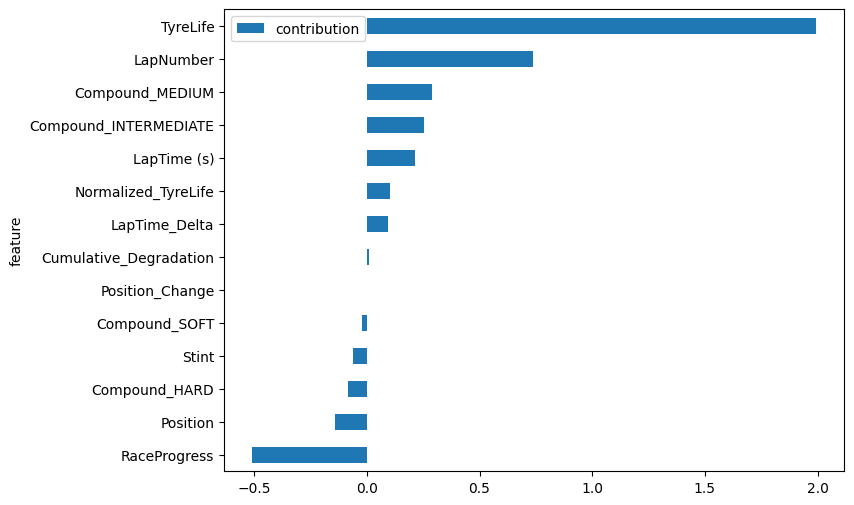

In [ ]:
df.sort_values("contribution").plot.barh(
    x="feature", y="contribution", figsize=(8,6)
)

Dla tego przypadku najważniejsze cechy z czynnikiem dodatnim

In [ ]:
for x in df.sort_values("contribution", ascending = False)["feature"].head(5).values:
    print(x)

TyreLife
LapNumber
Compound_MEDIUM
Compound_INTERMEDIATE
LapTime (s)


Dla porównania, globalnie

In [ ]:
for x in coefficients[lambda x: x > 0].sort_values(ascending = False).head(5).index:
    print(x)

Stint
TyreLife
LapNumber
Normalized_TyreLife
Compound_MEDIUM


<Axes: xlabel='feature'>

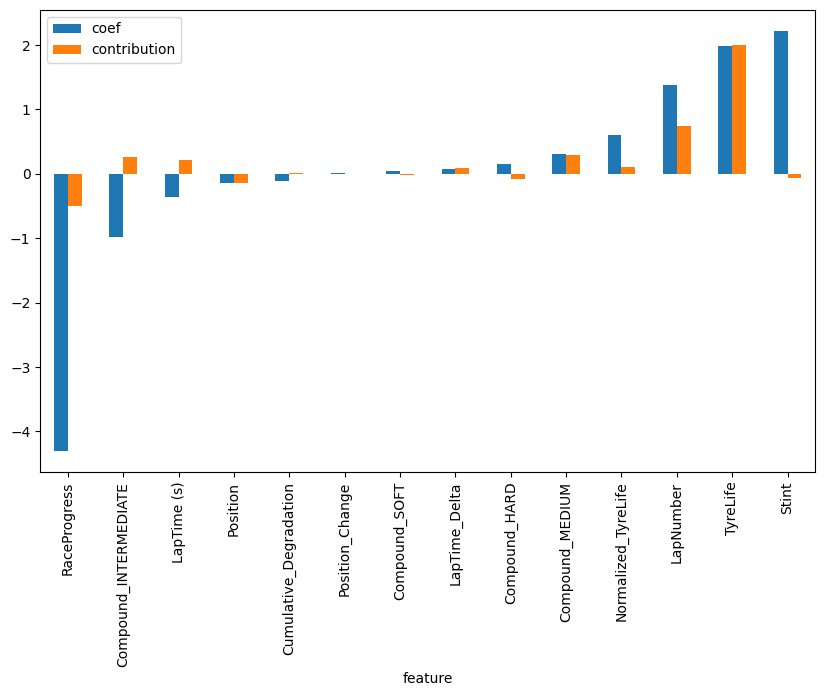

In [ ]:
df.set_index("feature")[["coef", "contribution"]].sort_values("coef").plot.bar(figsize=(10, 6))

In [ ]:
model_rl.predict(pd.DataFrame(sample).T)

array([1])

# Partial Dependance Plot (PDP) i Individual Conditional Expectation (ICE) dla modelu regresji logistczynej

In [ ]:
print(X_test.dtypes)
print(X_test.nunique().sort_values())

LapNumber                   int64
Stint                       int64
TyreLife                  float64
Position                    int64
LapTime (s)               float64
LapTime_Delta             float64
Cumulative_Degradation    float64
RaceProgress              float64
Normalized_TyreLife       float64
Position_Change           float64
Compound_HARD                bool
Compound_INTERMEDIATE        bool
Compound_MEDIUM              bool
Compound_SOFT                bool
dtype: object
Compound_MEDIUM             2
Compound_SOFT               2
Compound_HARD               2
Compound_INTERMEDIATE       2
Stint                       4
Position                   20
TyreLife                   33
Position_Change            33
LapNumber                  44
RaceProgress              236
Normalized_TyreLife       366
LapTime_Delta             610
LapTime (s)               616
Cumulative_Degradation    622
dtype: int64


Cechy do PDP: ['LapNumber', 'Stint', 'TyreLife', 'Position', 'LapTime (s)', 'LapTime_Delta', 'Cumulative_Degradation', 'RaceProgress', 'Normalized_TyreLife', 'Position_Change']


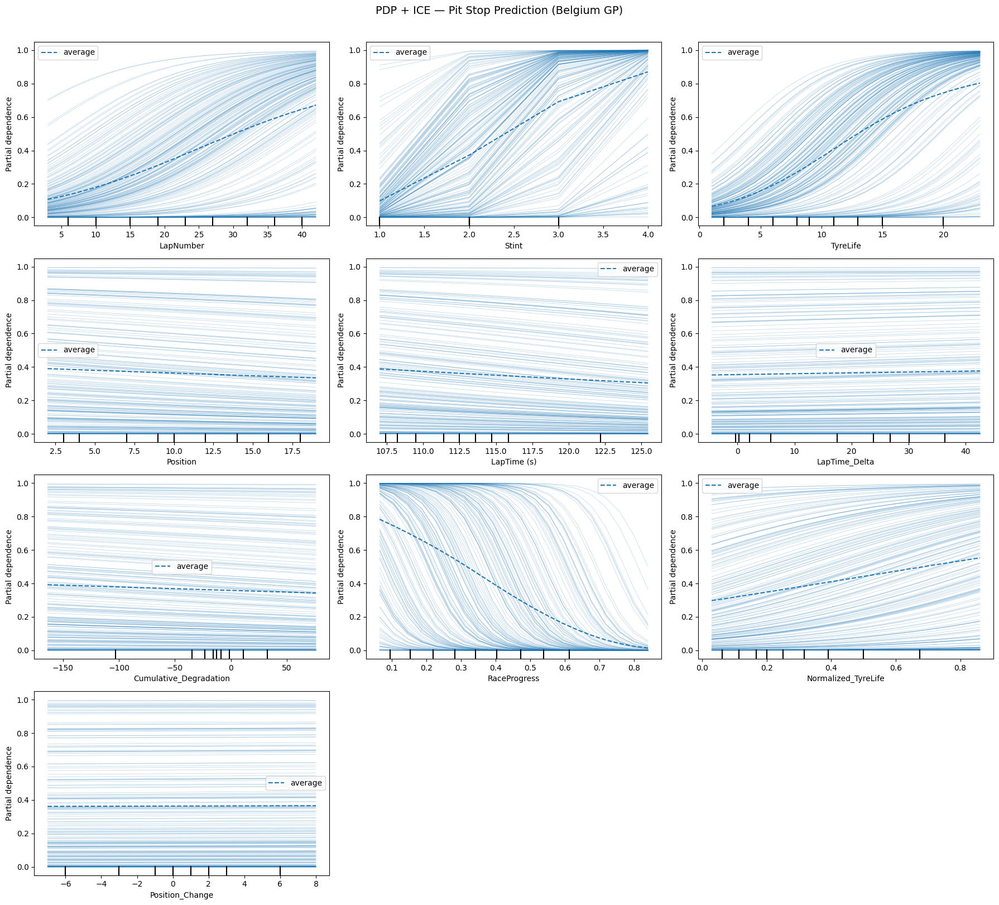

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

dummy_cols = [col for col in X_test.columns if col.startswith("Compound_")]
continuous_cols = [col for col in X_test.columns if col not in dummy_cols]

print("Cechy do PDP:", continuous_cols)

n = len(continuous_cols)
ncols = 3
nrows = (n + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, nrows * 4))
axes_flat = axes.ravel()

PartialDependenceDisplay.from_estimator(
    model_rl,
    X_test,
    features=continuous_cols,
    kind="both",
    random_state=42,
    grid_resolution=20,
    subsample=200,
    ax=axes_flat[:n]
)

for ax in axes_flat[n:]:
    ax.set_visible(False)

plt.suptitle("PDP + ICE — Pit Stop Prediction (Belgium GP)", y=1.01, fontsize=14)
plt.tight_layout()
plt.show()

# SHAP dla regresji logistycznej

SHAP (SHapley Additive exPlanations) to metoda wyjaśniania modeli uczenia maszynowego oparta na teorii gier, która przypisuje każdej cesze wkład w predykcję modelu w sposób spójny i matematycznie uzasadniony.

In [ ]:
!pip install shap

In [ ]:
import shap

In [ ]:
model = LogisticRegression(max_iter=500)
model.fit(X_train, y_train)

LogisticRegression(max_iter=500)

In [ ]:
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer.shap_values(X_test)

i = 15
sample = X_test.iloc[i]
sample

,5987
LapNumber,21
Stint,2
TyreLife,14.0
Position,19
LapTime (s),120.162
LapTime_Delta,3.736
Cumulative_Degradation,-6.767
RaceProgress,0.913043
Normalized_TyreLife,0.875
Position_Change,0.0


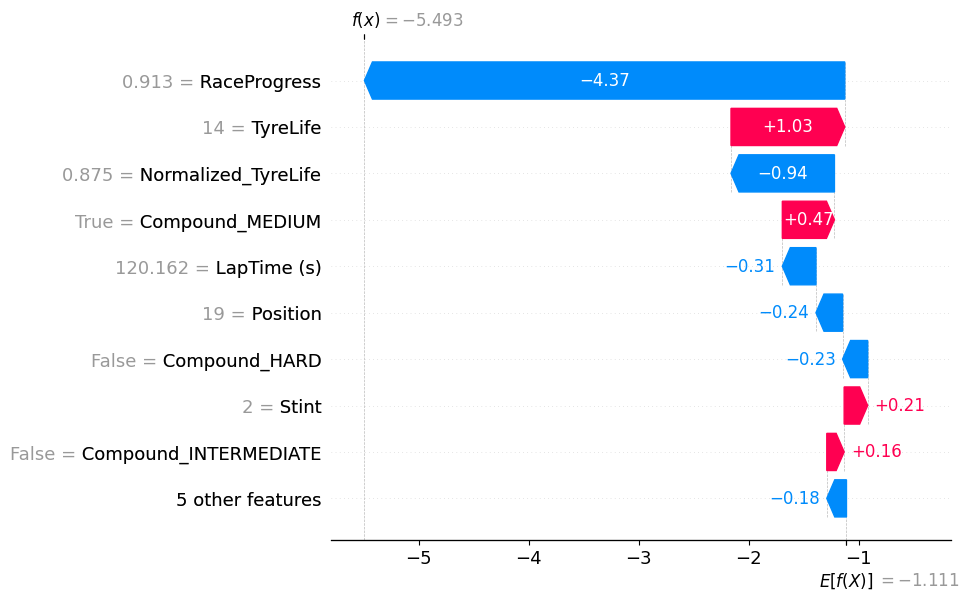

In [ ]:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values[i],
        base_values=explainer.expected_value,
        data=sample
    )
)

In [ ]:
X_train_fixed = X_train.astype(float)
X_test_fixed = X_test.astype(float)

explainer = shap.LinearExplainer(model, X_train_fixed)

shap_values = explainer(X_test_fixed)

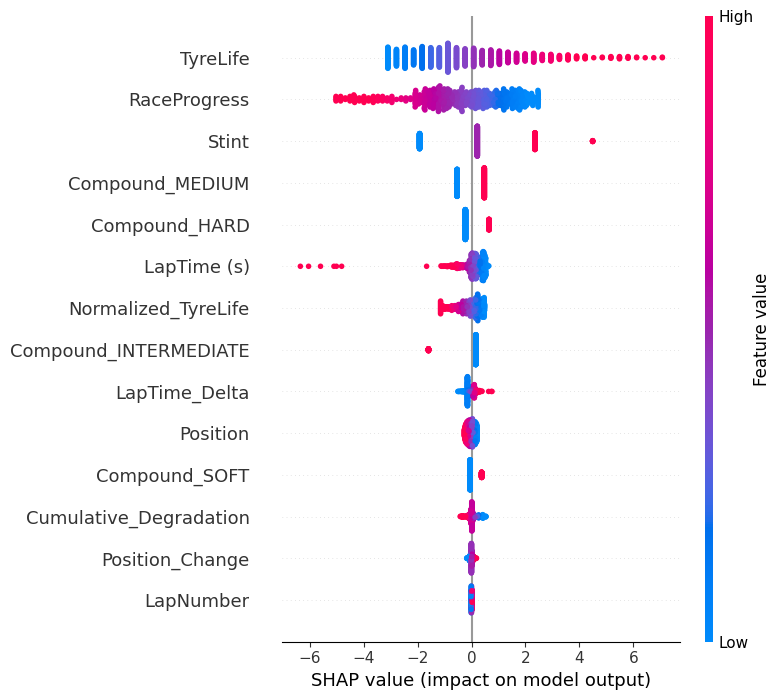

In [ ]:
shap.summary_plot(shap_values)

# Sanity checks - feature shuffling dla rl

Feature shuffling

In [ ]:
# baseline
y_pred = model_rl.predict_proba(X_test)[:,1]
baseline_auc = roc_auc_score(y_test, y_pred)

# permutujemy jedną cechę
X_test_shuffled = X_test.copy()
X_test_shuffled["RaceProgress"] = np.random.permutation(X_test_shuffled["LapTime_Delta"])

# nowy wynik
y_pred_shuffled = model.predict_proba(X_test_shuffled)[:,1]
shuffled_auc = roc_auc_score(y_test, y_pred_shuffled)

print("Baseline AUC:", baseline_auc)
print("After shuffling:", shuffled_auc)
print("Drop:", baseline_auc - shuffled_auc)

Baseline AUC: 0.9058347016967707
After shuffling: 0.5088341543513958
Drop: 0.39700054734537493


# Drzewo decyzyjne

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
tree = DecisionTreeClassifier(max_depth=3)

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size = 0.2,
    stratify = y,
    random_state = 42
)

tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

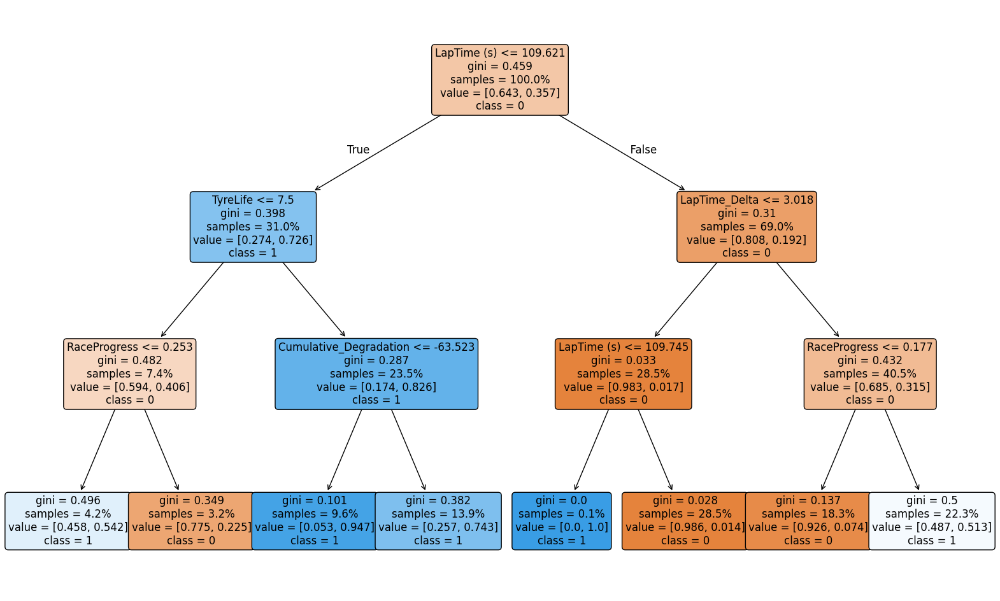

In [ ]:
from sklearn.tree import plot_tree


plt.figure(figsize=(20, 12))

plot_tree(
    tree,
    feature_names=X.columns,
    filled=True,
    fontsize=12,
    rounded=True,
    proportion=True,
    class_names=["0", "1"],
)

plt.show()

Trzy najpewniejsze zestawy warunków:

1.
- 109.745 > LapTime > 109.621
- LapTime_delta <= 3.018

gini = 0 -> w 100% przypadków występuje klasa 1 (Pit stop)

2.
- LapTime <= 109.621
- TyreLife > 7.5
- Cumulative_Degradation <= -63.523

wtedy gini = 0.101 -> w prawie 95% przypadków występuje wtedy klasa 1 (czyli pit stop)

3.
- LapTime (s) > 109.621
- LapTime_Delta <= 3.018
- LapTime (s) > 109.745

gini = 0.028 -> w 98.6% przypadków występuje klasa 0.

In [ ]:
from sklearn.tree import _tree

def explain_decision(tree, feature_names, sample):
    tree_ = tree.tree_
    feature = tree_.feature
    threshold = tree_.threshold

    node = 0

    while tree_.feature[node] != _tree.TREE_UNDEFINED:
        feat_name = feature_names[feature[node]]
        value = sample[feat_name]

        if value <= threshold[node]:
            print(f"{feat_name} <= {threshold[node]:.2f}")
            node = tree_.children_left[node]
        else:
            print(f"{feat_name} > {threshold[node]:.2f}")
            node = tree_.children_right[node]

    print("\nLEAF")

    values = tree_.value[node][0]  # np. [n_class0, n_class1]
    predicted_class = np.argmax(values)

    print("value:", values)
    print(f"Predicted class: {predicted_class}")


sample = X_test.iloc[0]
explain_decision(tree, X.columns, sample)

LapTime (s) <= 109.62
TyreLife > 7.50
Cumulative_Degradation > -63.52

LEAF
value: [0.25714286 0.74285714]
Predicted class: 1


# Model Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

In [ ]:
rf = RandomForestClassifier(class_weight='balanced', n_estimators=100)

rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced')

In [ ]:
cross_val_score(rf, X, y, cv=5, scoring="roc_auc").mean()

np.float64(0.8605045145857406)

# Permutation Feature Importance - jak bardzo zaburzenie jednej cechy wpływa na jakość modelu RandomForest

In [ ]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    rf, X_test, y_test,
    n_repeats=10,
    random_state=42,
    scoring="roc_auc"
)

# sortowanie wyników
importance_df = pd.DataFrame({
    "feature": X.columns,
    "importance_mean": result.importances_mean,
    "importance_std": result.importances_std
}).sort_values("importance_mean", ascending=False)

importance_df

,feature,importance_mean,importance_std
5,LapTime_Delta,0.060437,0.007868
4,LapTime (s),0.032987,0.003431
6,Cumulative_Degradation,0.029707,0.002651
2,TyreLife,0.020808,0.002362
1,Stint,0.020432,0.002858
9,Position_Change,0.016560,0.001476
0,LapNumber,0.013551,0.002213
8,Normalized_TyreLife,0.013433,0.002498
7,RaceProgress,0.010897,0.001660
3,Position,0.009255,0.000772


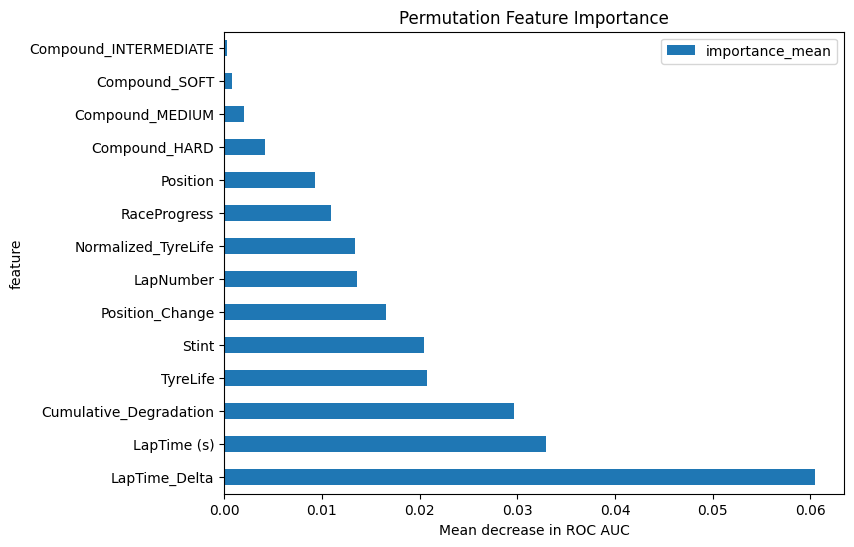

In [ ]:
importance_df.plot.barh(x="feature", y="importance_mean", figsize=(8,6))
plt.xlabel("Mean decrease in ROC AUC")
plt.title("Permutation Feature Importance")
plt.show()

Cechy, które mają największy wpływ na model:
1. LapTime_Delta
2. LapTime
3. Cumulative_Degradation
4. TyreLife
5. Stint

# DALEX

In [ ]:
!pip install dalex

In [ ]:
import dalex as dx

# tworzymy explainer
explainer = dx.Explainer(rf, X_test, y_test, label="RandomForestClassifier")

# ważność cech (feature importance)
vi = explainer.model_parts()
vi.plot()

Preparation of a new explainer is initiated

  -> data              : 631 rows 14 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 631 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : RandomForestClassifier
  -> predict function  : <function yhat_proba_default at 0x7845c659d1c0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.361, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.88, mean = -0.00444, max = 0.98
  -> model_info        : package sklearn

A new explainer has been created!


Model średnio daje 36% prawdopodobieństwa klasy 1.

# Partial Dependance Plot (PDP) i Individual Conditional Expectation (ICE) dla modelu Random Forest

Cechy do PDP: ['LapNumber', 'Stint', 'TyreLife', 'Position', 'LapTime (s)', 'LapTime_Delta', 'Cumulative_Degradation', 'RaceProgress', 'Normalized_TyreLife', 'Position_Change']


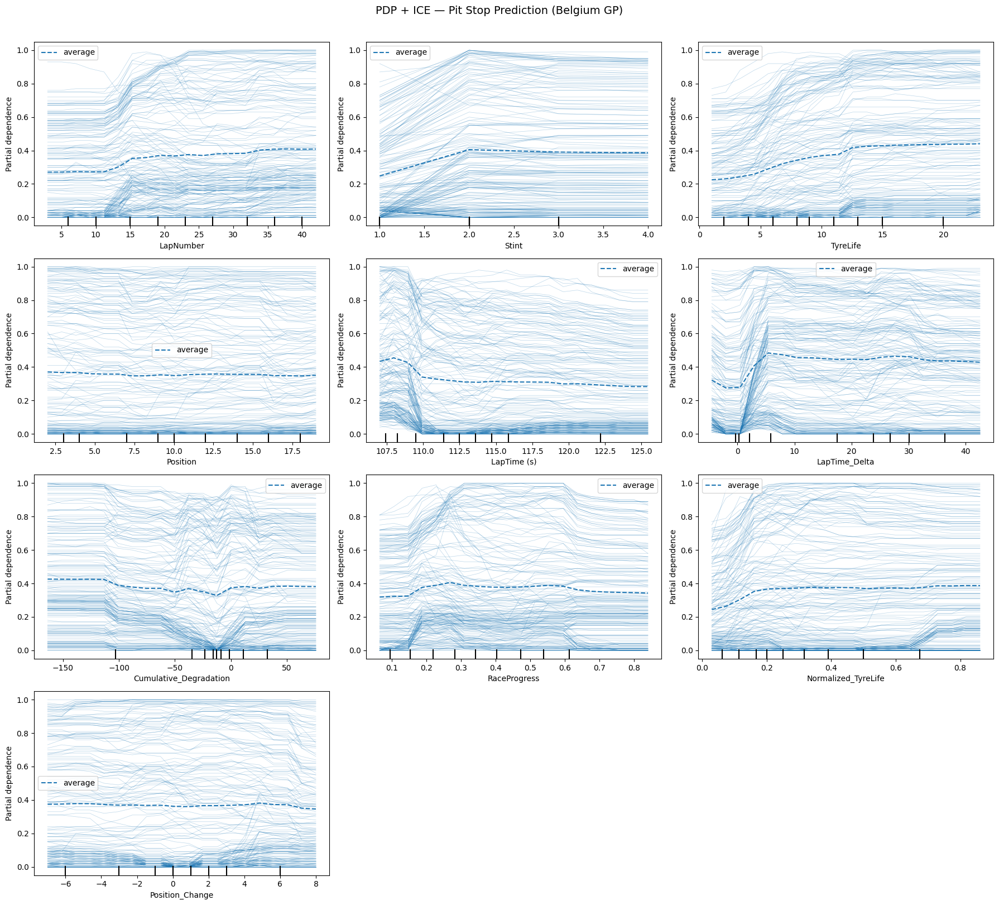

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

dummy_cols = [col for col in X_test.columns if col.startswith("Compound_")]
continuous_cols = [col for col in X_test.columns if col not in dummy_cols]

print("Cechy do PDP:", continuous_cols)

n = len(continuous_cols)
ncols = 3
nrows = (n + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, nrows * 4))
axes_flat = axes.ravel()

PartialDependenceDisplay.from_estimator(
    rf,
    X_test,
    features=continuous_cols,
    kind="both",
    random_state=42,
    grid_resolution=20,
    subsample=200,
    ax=axes_flat[:n]
)

for ax in axes_flat[n:]:
    ax.set_visible(False)

plt.suptitle("PDP + ICE — Pit Stop Prediction (Belgium GP)", y=1.01, fontsize=14)
plt.tight_layout()
plt.show()

# LIME dla Random Forest

LIME (Local Interpretable Model-agnostic Explanations) - Wyjaśnienia lokalne, interpretacja jednostkowych decyzji, analiza stabilności i wpływu losowości. Jest to metoda wyjaśniania modeli uczenia maszynowego, która tłumaczy pojedyncze predykcje poprzez lokalne przybliżenie działania modelu prostszym, interpretowalnym modelem (np. liniowym).

In [ ]:
!pip install lime

In [ ]:
from lime.lime_tabular import LimeTabularExplainer
import warnings
warnings.simplefilter("ignore")

In [ ]:
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    class_names=["NoPitStopNextLap", "PitStopNextLap"],
    mode="classification",
    discretize_continuous=True
)

In [ ]:
i = 0  # indeks próbki
sample = X_test.iloc[i].values

exp = explainer.explain_instance(
    sample,
    rf.predict_proba,
    num_features=10
)

In [ ]:
exp.show_in_notebook()

Reguły dla lokalnej próbki, które cechy pchają w którą stronę predykcję

In [ ]:
for element in  exp.as_list():
    print(element)

('TyreLife > 14.00', 0.10482756807248964)
('LapTime (s) <= 108.76', 0.08367048059047254)
('1.00 < Stint <= 2.00', 0.06980132870588807)
('LapTime_Delta > 27.28', 0.038723151343122084)
('-29.05 < Cumulative_Degradation <= -12.66', -0.038530004153588905)
('0.25 < Normalized_TyreLife <= 0.44', 0.03447312466814132)
('Compound_SOFT <= 0.00', 0.025965028385405105)
('Compound_INTERMEDIATE <= 0.00', 0.01959090410012754)
('22.00 < LapNumber <= 33.00', 0.017523007563278962)
('Compound_HARD <= 0.00', 0.008956479443526186)


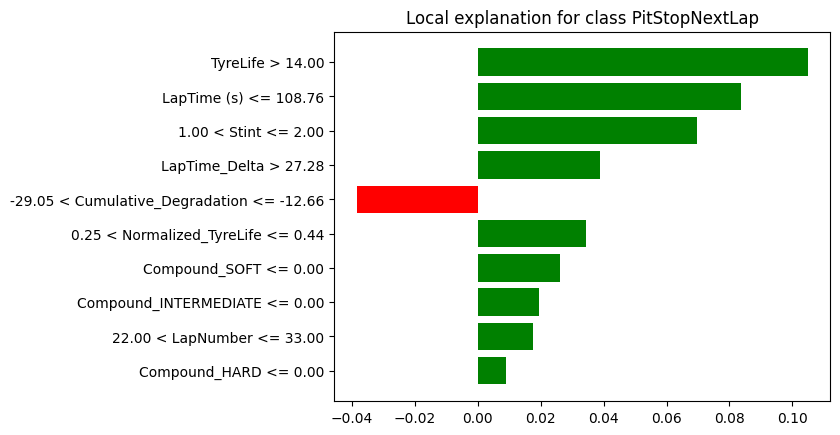

In [ ]:
fig = exp.as_pyplot_figure()

In [ ]:
for j in range(5):
    print(f"============== {j+1} iteration ==============")
    exp = explainer.explain_instance(
        X_test.iloc[0].values,
        rf.predict_proba,
        num_features=5
    )
    for element in  exp.as_list():
        print(element)
    print("------")

============== 1 iteration ==============
('TyreLife > 14.00', 0.10107974480882898)
('LapTime (s) <= 108.76', 0.08309014355767004)
('1.00 < Stint <= 2.00', 0.07882814911166448)
('LapTime_Delta > 27.28', 0.04635302094315683)
('-29.05 < Cumulative_Degradation <= -12.66', -0.03929298459441737)
------
============== 2 iteration ==============
('TyreLife > 14.00', 0.098501795736627)
('LapTime (s) <= 108.76', 0.07878388837254485)
('1.00 < Stint <= 2.00', 0.07084313205385676)
('LapTime_Delta > 27.28', 0.044638378425289775)
('-29.05 < Cumulative_Degradation <= -12.66', -0.03025842892649553)
------
============== 3 iteration ==============
('TyreLife > 14.00', 0.10377377532202461)
('LapTime (s) <= 108.76', 0.07887604990429894)
('1.00 < Stint <= 2.00', 0.07122268158562231)
('-29.05 < Cumulative_Degradation <= -12.66', -0.04415192913834827)
('LapTime_Delta > 27.28', 0.040546992583501924)
------
============== 4 iteration ==============
('TyreLife > 14.00', 0.11377266318091082)
('LapTime (s) <= 10

Pierwsze 3 cechy w każdej próbce takie same (TyreLife, LapTime i LapTime_Delta), jedynie pozycje 4. i 5. się zmieniają. Główne cechy zachowują mniej więcej taką samą wagę (ich wpływ na predykcje przy każdej próbce).

In [ ]:
features_runs = []

for _ in range(10):
    exp = explainer.explain_instance(
        X.iloc[0].values,
        rf.predict_proba,
        num_features=5
    )
    features_runs.append([f[0] for f in exp.as_list()])

pd.DataFrame(features_runs).T

,0,1,2,3,4,5,6,7,8,9
0,TyreLife <= 5.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,TyreLife <= 5.00,Stint <= 1.00
1,Stint <= 1.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,Stint <= 1.00,TyreLife <= 5.00
2,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25
3,LapNumber <= 12.00,LapNumber <= 12.00,LapNumber <= 12.00,LapNumber <= 12.00,LapNumber <= 12.00,LapNumber <= 12.00,LapNumber <= 12.00,LapNumber <= 12.00,LapNumber <= 12.00,LapNumber <= 12.00
4,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96


# SHAP dla Random Forest

In [ ]:
explainer = shap.TreeExplainer(rf)

In [ ]:
shap_values = explainer.shap_values(X_test,y_test)
shap_values

array([[[-7.88167928e-03,  7.88167928e-03],
        [-2.59276286e-02,  2.59276286e-02],
        [-5.44167006e-02,  5.44167006e-02],
        ...,
        [-6.94438705e-04,  6.94438705e-04],
        [ 8.73144870e-03, -8.73144870e-03],
        [ 1.16847386e-03, -1.16847386e-03]],

       [[-3.28911804e-02,  3.28911804e-02],
        [-3.64656497e-02,  3.64656497e-02],
        [-7.04054477e-02,  7.04054477e-02],
        ...,
        [-9.15478722e-04,  9.15478722e-04],
        [-2.21182632e-03,  2.21182632e-03],
        [-6.51256865e-03,  6.51256865e-03]],

       [[-1.13840016e-02,  1.13840016e-02],
        [-7.90707988e-03,  7.90707988e-03],
        [ 6.34036353e-02, -6.34036353e-02],
        ...,
        [-6.03138417e-04,  6.03138417e-04],
        [ 3.46974747e-03, -3.46974747e-03],
        [ 1.77515882e-02, -1.77515882e-02]],

       ...,

       [[-4.51573599e-02,  4.51573599e-02],
        [-3.53360525e-02,  3.53360525e-02],
        [-7.40595192e-02,  7.40595192e-02],
        ...,
     

Interpretacja pojedynczej obserwacji - Waterfall SHAP -> jak każda cecha przesuwa predykcję od średniej do końcowej decyzji

In [ ]:
i = 15
sample = X_test.iloc[i]

In [ ]:
shap_values.shape

(631, 14, 2)

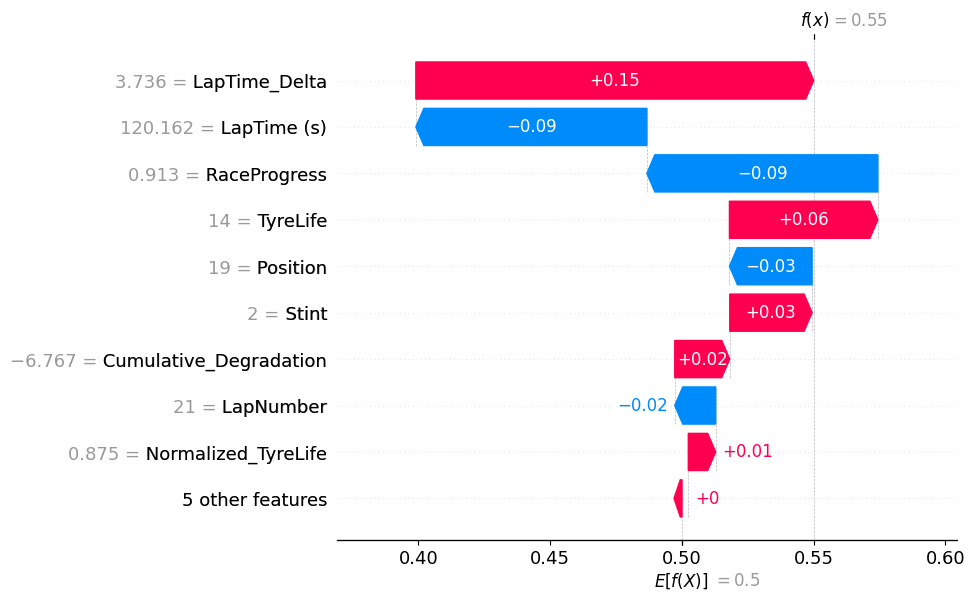

In [ ]:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values[i, :, 1],
        base_values=explainer.expected_value[1],
        data=sample
    )
)

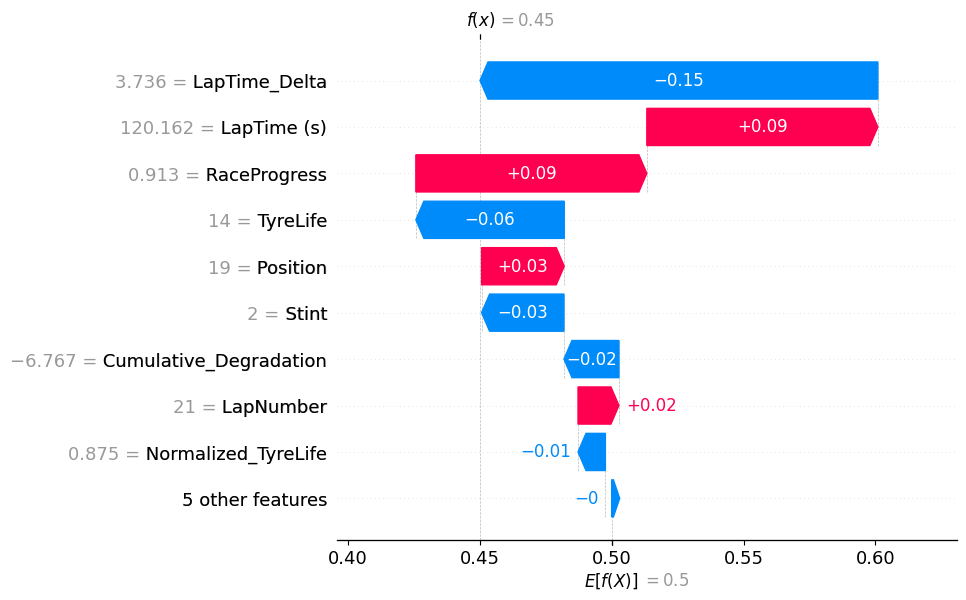

In [ ]:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values[i, :, 0],
        base_values=explainer.expected_value[0],
        data=sample
    )
)

Globalna interpretacja

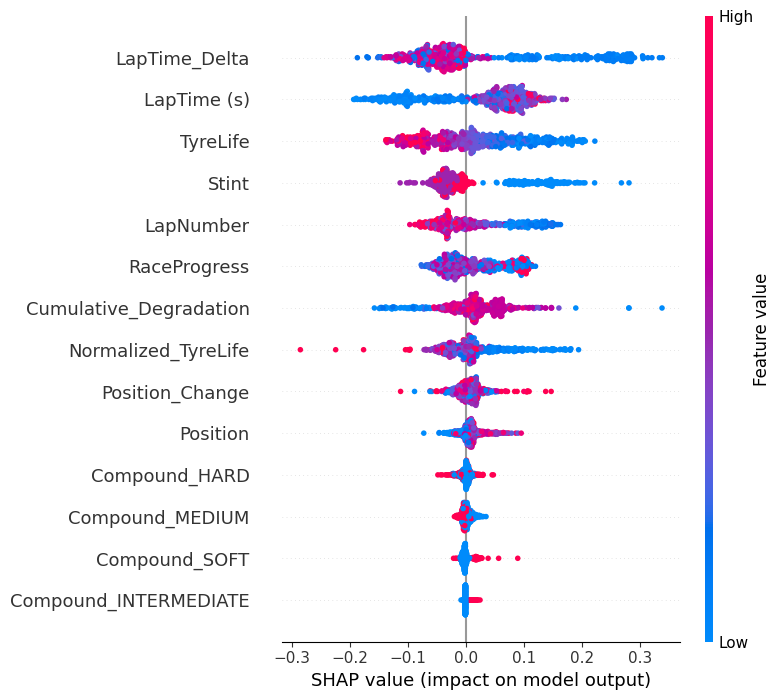

In [ ]:
shap.summary_plot(shap_values[:, :, 0], X_test)

Dość duży rozrzut świadczy o tym, że wpływ cech jest zmienny.

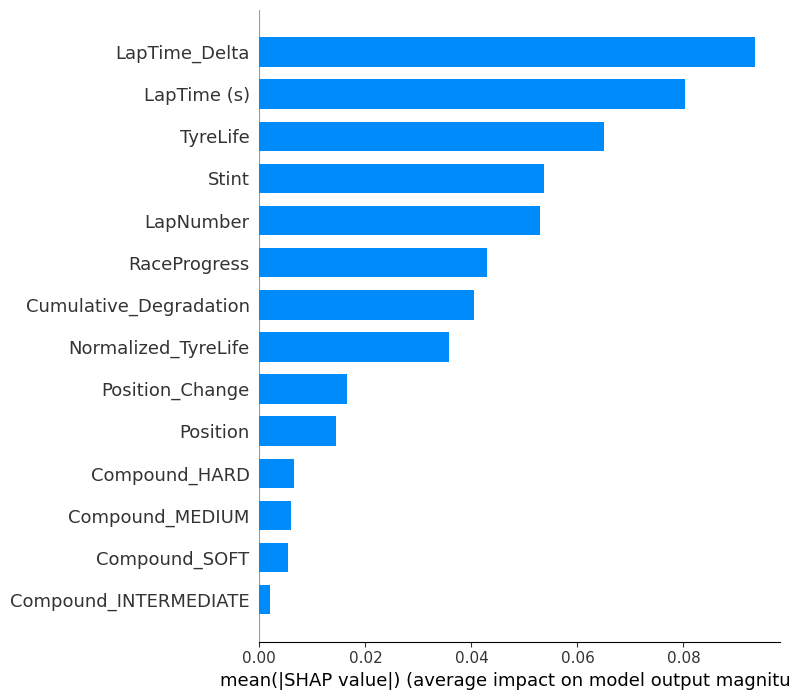

In [ ]:
shap.summary_plot(shap_values[:, :, 0], X_test, plot_type="bar")

# Sanity checks randomizacja i dummy feature dla rf

Randomization test

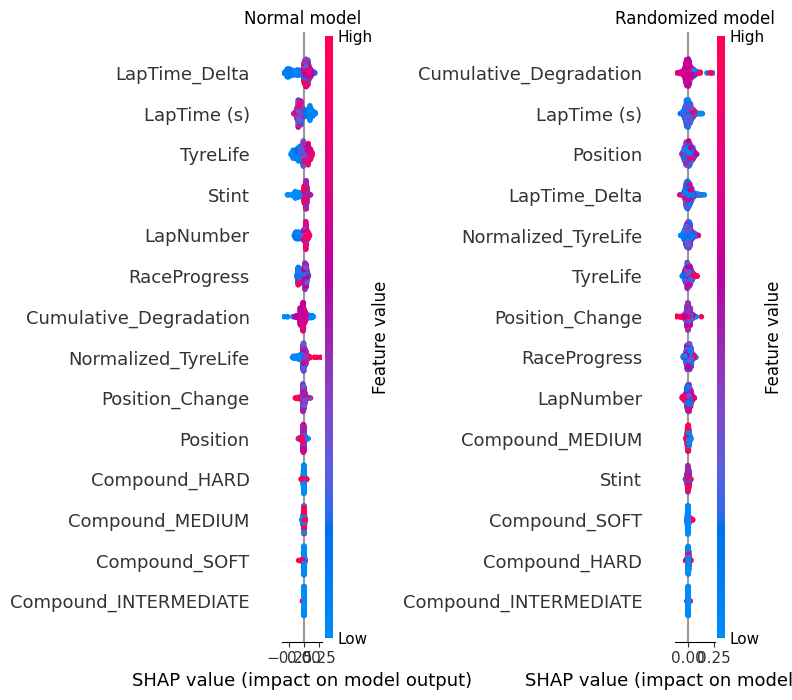

In [ ]:
# 1. model z losowymi etykietami
y_random = np.random.permutation(y_train)

model_random = RandomForestClassifier(random_state=42)
model_random.fit(X_train, y_random)

explainer_random = shap.TreeExplainer(model_random)
shap_values_random = explainer_random.shap_values(X_test)

# 2. model normalny
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test,y_test)

# 3. porównanie ---

fig, axes = plt.subplots(1, 2, figsize=(32, 16))

plt.sca(axes[0])
shap.summary_plot(shap_values[:, :, 1], X_test, show=False)
axes[0].set_title("Normal model")

plt.sca(axes[1])
shap.summary_plot(shap_values_random[:, :, 1], X_test, show=False)
axes[1].set_title("Randomized model")

plt.tight_layout()
plt.show()

Dummy feature test

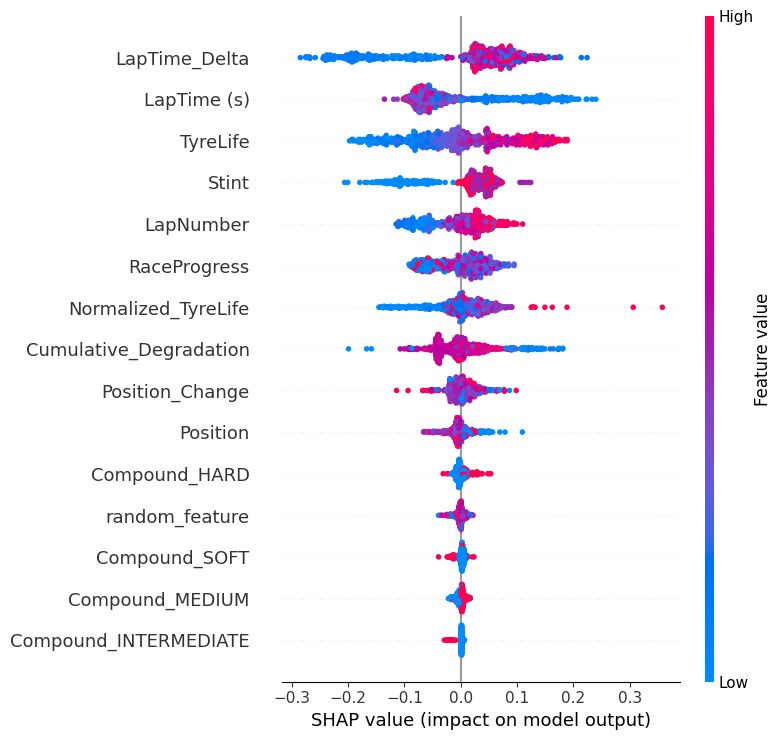

In [ ]:
# kopiujemy dane
X_train_dummy = X_train.copy()
X_test_dummy = X_test.copy()

# dodajemy losową cechę
X_train_dummy["random_feature"] = np.random.random(len(X_train_dummy))
X_test_dummy["random_feature"] = np.random.random(len(X_test_dummy))

# trenujemy model
model2 = RandomForestClassifier(random_state=42)
model2.fit(X_train_dummy, y_train)

# SHAP
explainer = shap.TreeExplainer(model2)
shap_values = explainer.shap_values(X_test_dummy)

# wykres globalny
shap.summary_plot(shap_values[:, :, 1], X_test_dummy)

In [ ]:
result = permutation_importance(
    model2, X_test_dummy, y_test,
    n_repeats=10,
    random_state=42,
    scoring="roc_auc"
)

# sortowanie wyników
importance_df = pd.DataFrame({
    "feature": X_test_dummy.columns,
    "importance_mean": result.importances_mean,
    "importance_std": result.importances_std
}).sort_values("importance_mean", ascending=False)

importance_df

,feature,importance_mean,importance_std
5,LapTime_Delta,0.056404,0.005762
4,LapTime (s),0.032018,0.003106
2,TyreLife,0.031900,0.003890
6,Cumulative_Degradation,0.026112,0.002406
1,Stint,0.021678,0.002876
9,Position_Change,0.016105,0.001365
8,Normalized_TyreLife,0.012991,0.001856
7,RaceProgress,0.010762,0.002243
0,LapNumber,0.010447,0.001458
3,Position,0.009373,0.001258


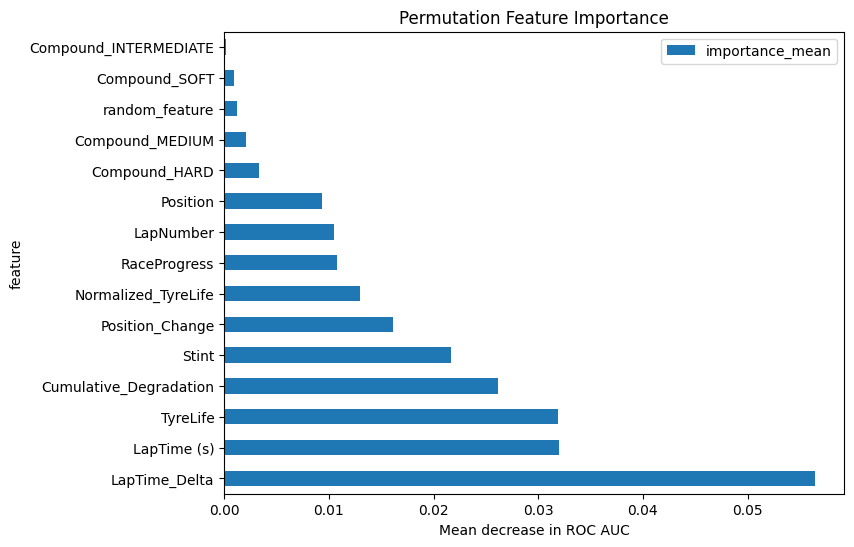

In [ ]:
importance_df.plot.barh(x="feature", y="importance_mean", figsize=(8,6))
plt.xlabel("Mean decrease in ROC AUC")
plt.title("Permutation Feature Importance")
plt.show()

Random feature ma małą ważność, zatem model zdaje test.

# XGBoost

In [ ]:
!pip install xgboost

from xgboost import XGBClassifier

xgb_model = XGBClassifier(
    n_estimators=100,
    random_state=42,
    eval_metric='logloss',
    verbosity=0
)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

Accuracy:          0.9397781299524565
Balanced Accuracy: 0.936360153256705

              precision    recall  f1-score   support

           0       0.96      0.95      0.95       406
           1       0.91      0.92      0.92       225

    accuracy                           0.94       631
   macro avg       0.93      0.94      0.93       631
weighted avg       0.94      0.94      0.94       631



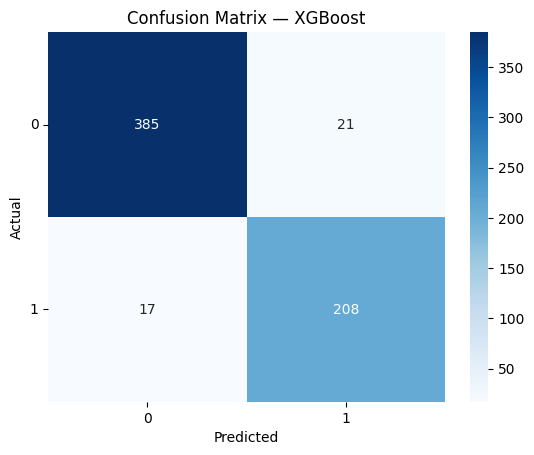

In [ ]:
y_pred_xgb = xgb_model.predict(X_test)

print("Accuracy:         ", accuracy_score(y_test, y_pred_xgb))
print("Balanced Accuracy:", balanced_accuracy_score(y_test, y_pred_xgb))
print()
print(classification_report(y_test, y_pred_xgb))

cm = confusion_matrix(y_test, y_pred_xgb)
sns.heatmap(pd.DataFrame(cm), annot=True, fmt='d', cmap='Blues')
plt.yticks(rotation=0)
plt.xlabel('Predicted'); plt.ylabel('Actual')
plt.title('Confusion Matrix — XGBoost')
plt.show()

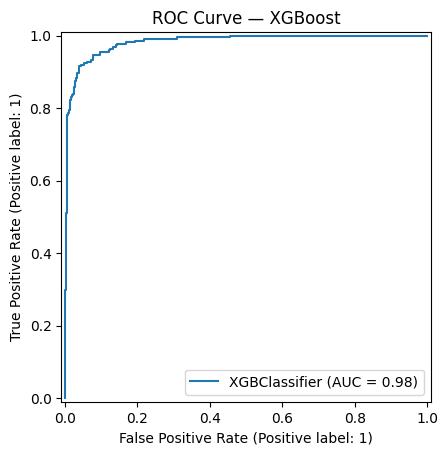

np.float64(0.983087027914614)

In [ ]:
RocCurveDisplay.from_estimator(xgb_model, X_test, y_test)
plt.title('ROC Curve — XGBoost')
plt.show()

roc_auc_score(y_test, xgb_model.predict_proba(X_test)[:, 1])

In [ ]:
xgb_auc = cross_val_score(xgb_model, X, y, cv=5, scoring='roc_auc').mean()
print(f'XGBoost — średni ROC-AUC (CV=5): {xgb_auc:.4f}')

XGBoost — średni ROC-AUC (CV=5): 0.8463


# Permutation Feature Importance dla XGBoost

In [ ]:
result_xgb = permutation_importance(
    xgb_model, X_test, y_test,
    n_repeats=10,
    random_state=42,
    scoring='roc_auc'
)

importance_xgb_df = pd.DataFrame({
    'feature': X.columns,
    'importance_mean': result_xgb.importances_mean,
    'importance_std':  result_xgb.importances_std
}).sort_values('importance_mean', ascending=False)

importance_xgb_df

,feature,importance_mean,importance_std
1,Stint,0.075562,0.008236
2,TyreLife,0.051456,0.005068
5,LapTime_Delta,0.045557,0.005644
6,Cumulative_Degradation,0.038148,0.004040
4,LapTime (s),0.027946,0.005203
7,RaceProgress,0.023956,0.002812
3,Position,0.015825,0.001397
9,Position_Change,0.014351,0.001962
8,Normalized_TyreLife,0.012914,0.003020
0,LapNumber,0.008472,0.001255


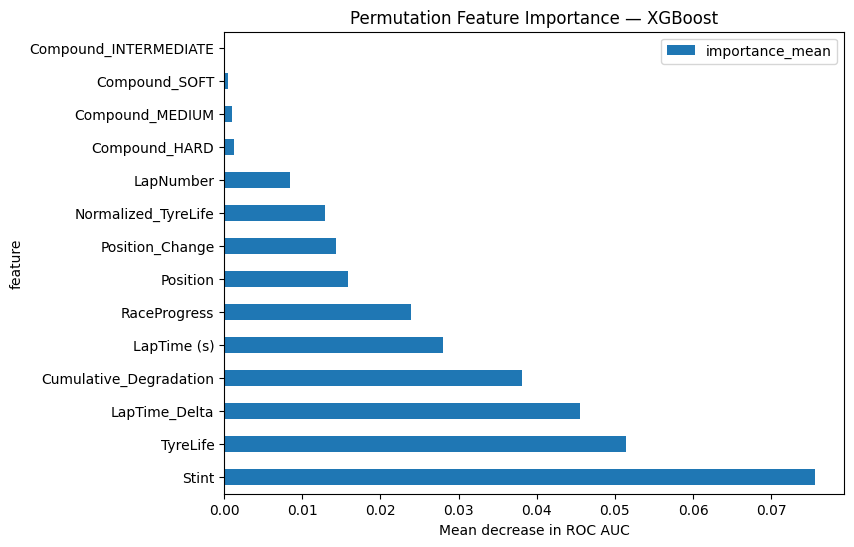

In [ ]:
importance_xgb_df.plot.barh(x='feature', y='importance_mean', figsize=(8, 6))
plt.xlabel('Mean decrease in ROC AUC')
plt.title('Permutation Feature Importance — XGBoost')
plt.show()

# PDP + ICE dla XGBoost

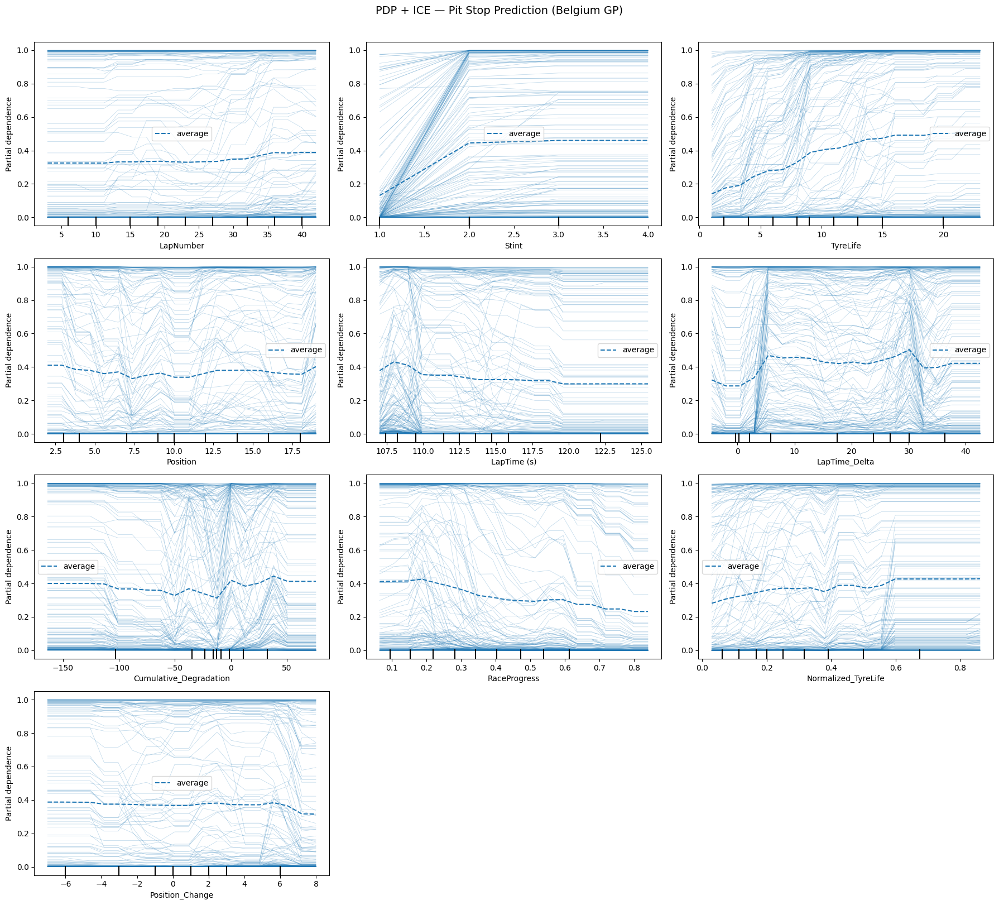

In [ ]:
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, nrows * 4))
axes_flat = axes.ravel()

PartialDependenceDisplay.from_estimator(
    xgb_model,
    X_test,
    features=continuous_cols,
    kind="both",
    random_state=42,
    grid_resolution=20,
    subsample=200,
    ax=axes_flat[:n]
)

for ax in axes_flat[n:]:
    ax.set_visible(False)

plt.suptitle("PDP + ICE — Pit Stop Prediction (Belgium GP)", y=1.01, fontsize=14)
plt.tight_layout()
plt.show()

# LIME dla XGBoost

In [ ]:
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    class_names=["NoPitStopNextLap", "PitStopNextLap"],
    mode="classification",
    discretize_continuous=True
)

In [ ]:
i = 0
sample = X_test.iloc[i].values

exp_xgb = explainer.explain_instance(
    sample,
    xgb_model.predict_proba,
    num_features=10
)
exp_xgb.show_in_notebook()

In [ ]:
features_runs = []

for _ in range(10):
    exp = explainer.explain_instance(
        X.iloc[0].values,
        xgb_model.predict_proba,
        num_features=5
    )
    features_runs.append([f[0] for f in exp.as_list()])

pd.DataFrame(features_runs).T

,0,1,2,3,4,5,6,7,8,9
0,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00,Stint <= 1.00
1,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00,TyreLife <= 5.00
2,LapTime_Delta <= 0.25,RaceProgress <= 0.18,RaceProgress <= 0.18,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,RaceProgress <= 0.18,RaceProgress <= 0.18,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25
3,RaceProgress <= 0.18,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,RaceProgress <= 0.18,RaceProgress <= 0.18,RaceProgress <= 0.18,LapTime_Delta <= 0.25,LapTime_Delta <= 0.25,RaceProgress <= 0.18,RaceProgress <= 0.18
4,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapTime (s) > 114.96,LapNumber <= 12.00,LapNumber <= 12.00,LapTime (s) > 114.96,LapTime (s) > 114.96


# SHAP dla XGBoost

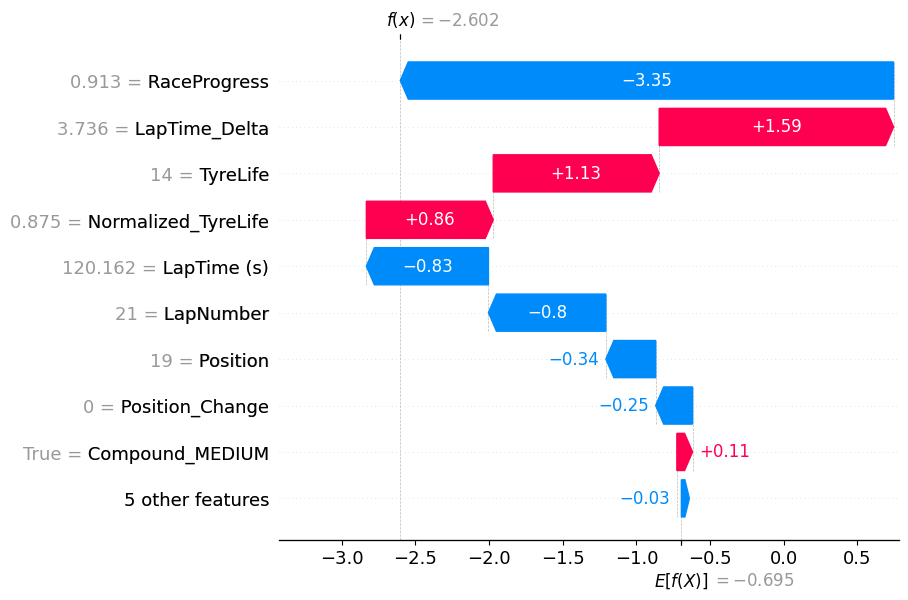

In [ ]:
explainer_xgb = shap.TreeExplainer(xgb_model)
shap_values_xgb = explainer_xgb.shap_values(X_test)

# Waterfall — pojedyncza próbka
i = 15
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values_xgb[i],
        base_values=explainer_xgb.expected_value,
        data=X_test.iloc[i]
    )
)

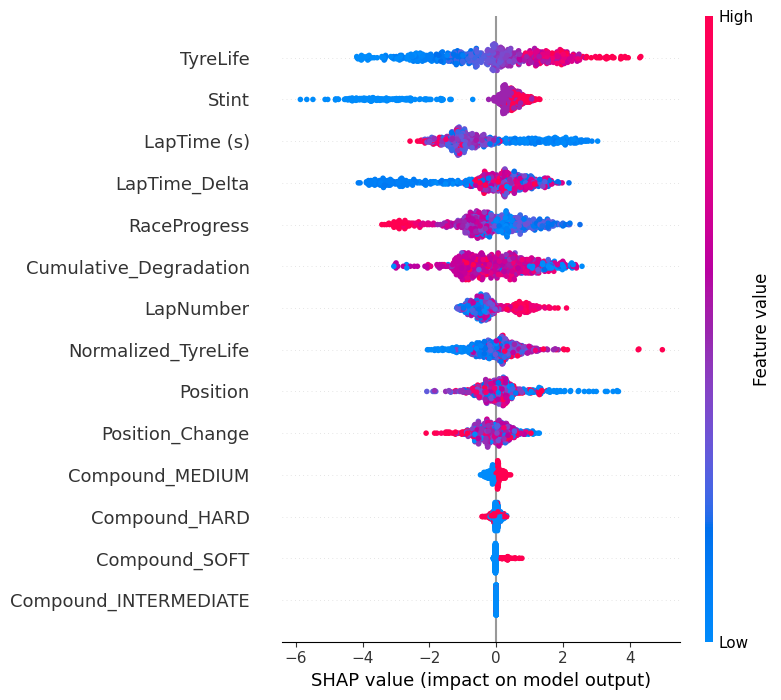

In [ ]:
shap.summary_plot(shap_values_xgb, X_test)

In [ ]:
for j in range(5):
    print(f"============== {j+1} iteration ==============")
    exp = explainer.explain_instance(
        X_test.iloc[0].values,
        rf.predict_proba,
        num_features=5
    )
    for element in  exp.as_list():
        print(element)
    print("------")

============== 1 iteration ==============
('TyreLife > 14.00', 0.09612004853487574)
('LapTime (s) <= 108.76', 0.08033105626885305)
('1.00 < Stint <= 2.00', 0.07677445102186863)
('LapTime_Delta > 27.28', 0.046491084388550014)
('-29.05 < Cumulative_Degradation <= -12.66', -0.03880829101314884)
------
============== 2 iteration ==============
('TyreLife > 14.00', 0.10699343514594462)
('LapTime (s) <= 108.76', 0.07891649358910799)
('1.00 < Stint <= 2.00', 0.07055942189303684)
('LapTime_Delta > 27.28', 0.04035827629851868)
('-29.05 < Cumulative_Degradation <= -12.66', -0.03814341954416408)
------
============== 3 iteration ==============
('TyreLife > 14.00', 0.11247249622665002)
('LapTime (s) <= 108.76', 0.08888322085765228)
('1.00 < Stint <= 2.00', 0.07460433672945707)
('LapTime_Delta > 27.28', 0.038204484322173285)
('-29.05 < Cumulative_Degradation <= -12.66', -0.03813450997859258)
------
============== 4 iteration ==============
('TyreLife > 14.00', 0.09976459605658253)
('LapTime (s) <= 

# Sanity check - randomizacja dla XGBoost

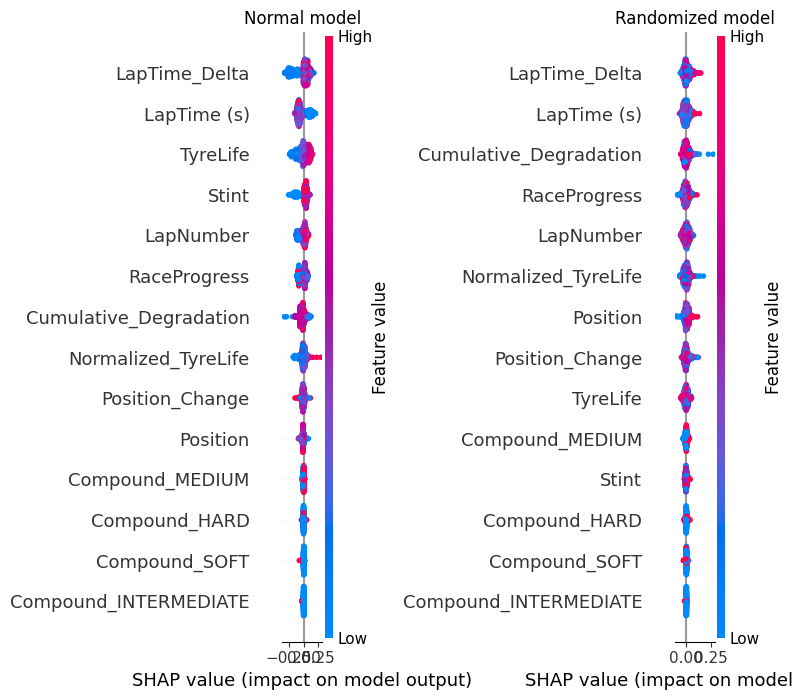

In [ ]:
# 1. model z losowymi etykietami
y_random = np.random.permutation(y_train)

model_random = RandomForestClassifier(random_state=42)
model_random.fit(X_train, y_random)

explainer_random = shap.TreeExplainer(model_random)
shap_values_random = explainer_random.shap_values(X_test)

# 2. model normalny
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test,y_test)

# 3. porównanie ---

fig, axes = plt.subplots(1, 2, figsize=(32, 16))

plt.sca(axes[0])
shap.summary_plot(shap_values[:, :, 1], X_test, show=False)
axes[0].set_title("Normal model")

plt.sca(axes[1])
shap.summary_plot(shap_values_random[:, :, 1], X_test, show=False)
axes[1].set_title("Randomized model")

plt.tight_layout()
plt.show()

# Spójność wyjaśnień

### Tabela porównawcza miar i metod XAI

| Obszar analizy / Metoda XAI | Regresja Logistyczna (RL) | Las Losowy (RF) | XGBoost |
| :--- | :--- | :--- | :--- |
| **Podstawowe Metryki (Test)** | • Accuracy: **0.82**<br>• Balanced Accuracy: **0.79** | • ROC AUC (z walidacji): **0.85** | • Accuracy: **0.94**<br>• ROC AUC: **0.98** |
| **Walidacja Krzyżowa (CV)** | • Stratified K-Fold (5 foldów)<br>• Średnie Accuracy: **0.8302**<br>• Średni Balanced Acc: **0.8035** | • Cross-val score ROC AUC: **0.85** | • Cross-val score ROC AUC: **0.85** |
| **Globalna Ważność Cech** | • **Współczynniki modelu (Coefficients)**<br>• Najważniejsze: `RaceProgress`, `Stint`, `TyreLife`, `LapNumber` | • **Permutation Feature Importance & DALEX**<br>• Najważniejsze: `LapTime_Delta`, `LapTime`, `Cumulative_Degradation` | • **Permutation Feature Importance**<br>• Najważniejsze: `Stint`, `TyreLife`, `LapTime_Delta`, `Cumulative_Degradation` |
| **Wyjaśnienia Lokalne** | • **Współczynniki lokalne dla próbki**<br>• Najważniejsze cechy: `TyreLife`, `LapNumber`, `Compound_MEDIUM` | • **LIME (5 iteracji – stabilność)**<br>• Najważniejsze cechy: `TyreLife`, `LapTime`, `LapTime_Delta` | • **LIME**<br>• Potwierdzenie hierarchii cech lokalnych |
| **Profilowanie SHAP** | • **Wyjaśnienie Klasy 1 (Pit-stop)**<br>• Liniowa, czysta separacja cech.<br>• Kluczowe: `TyreLife` (+), `RaceProgress` (-) | • **Wyjaśnienie Klasy 0 (Brak pit-stopu)**<br>• Nieliniowe interakcje cech.<br>• Kluczowe: `LapTime_Delta`, `LapTime` | • **Wyjaśnienie Klasy 1 (Pit-stop)**<br>• Połączenie makro-strategii i telemetrii.<br>• Kluczowe: `TyreLife`, `Stint`, `LapTime` |
| **Wykresy Zależności** | • **PDP i ICE**<br>• Charakterystyka wyłącznie monotoniczna/liniowa | • **PDP i ICE**<br>• Wyraźne uskoki, nieliniowe progi decyzyjne | • **PDP i ICE**<br>• Gładkie, ale złożone krzywe nieliniowe |
| **Testy Poczytalności (Sanity Checks)** | • **Feature Shuffling (`RaceProgress`)**<br>• Potężny spadek ROC AUC z **0.90 na 0.56** | • **Randomization Test & Dummy Feature**<br>• Wyjaśnienia zależne od modelu; cecha losowa ignorowana | •  **Randomization Test**; wyjaśnienia zależne od modelu<br> • Profilowanie spójności wewnętrznej na poziomie SHAP i PFI |

### Wnioski dotyczące spójności modeli:

1. **Konflikt Makro vs Mikro:** Obserwujemy klasyczne dla XAI zjawisko rozbieżności kryteriów decyzyjnych wynikające z budowy algorytmów.
   - **Regresja Logistyczna** to *„strateg makroskopowy”* – patrzy na ogólny plan wyścigu: jak stara jest opona (`TyreLife`) i na jakim etapie rywalizacji jesteśmy (`RaceProgress`). Marginalizuje chwilowe anomalie czasowe.
   - **Las Losowy** to *„strateg reaktywny”* – reaguje na nagłe anomalie w telemetrii okrążenia (`LapTime_Delta`, `LapTime`), odnajdując nieliniowe reguły (np. próg z drzewa decyzyjnego `LapTime <= 109.621 s`).
2. **XGBoost jako Pomost Decyzyjny:** Model XGBoost osiąga najwyższe metryki, ponieważ **łączy oba te podejścia**. W jego profilu SHAP oraz Permutation Importance na samym szczycie zgodnie współistnieją czynniki makro (`TyreLife`, `Stint`) oraz mikro-telemetryczne (`LapTime`, `LapTime_Delta`). Dzięki temu model rozumie zarówno zużycie fizyczne materiału, jak i bieżącą utratę tempa na torze.
3. **Problem Multikolinearności:** SHAP pięknie obnażył zachowanie regresji liniowej/logistycznej – cecha `LapNumber` spadła na sam dół ważności globalnej, mimo że na wykresach PDP wykazywała silny trend. Stało się tak, ponieważ jest perfekcyjnie skorelowana z `RaceProgress`, a model liniowy oddał całą wagę tylko jednej z nich. Modele drzewiaste (RF, XGBoost) znacznie lepiej dzielą ważność pomiędzy skorelowane zmienne.

# Podsumowanie/Raport

### Cel projektu

Projekt dotyczył przewidywania decyzji o pit stopie na następnym okrążeniu (`PitNextLap`) na podstawie danych telemetrycznych z wyścigu Formuły 1 — Grand Prix Belgii na torze Spa-Francorchamps. Celowe zawężenie do jednego wyścigu pozwoliło uniknąć zakłóceń wynikających z różnic między torami (inne mieszanki opon, różne długości okrążeń, odmienne okna strategiczne).

### Zbiór danych i preprocessing

Dane zawierały cechy telemetryczne (czas okrążenia, degradacja opon, pozycja, typ opony) dla wszystkich kierowców i okrążeń wyścigu belgijskiego. Zmienna kategoryczna `Compound` została zakodowana metodą one-hot encoding (`get_dummies`). Podział na zbiór treningowy i testowy wykonano ze stratyfikacją, co uwzględniło niezbalansowanie klas — pit stopy stanowią mniejszość obserwacji.

### Modele

Wytrenowano cztery modele:

- **Regresja logistyczna** — model z natury wyjaśnialny; wymaga skalowania cech. Osiągnęła accuracy 0.82 i balanced accuracy 0.79. Walidacja StratifiedKFold potwierdziła stabilność (std accuracy = 0.013).
- **Drzewo decyzyjne** (`max_depth=3`) — model z natury wyjaśnialny; pozwala śledzić każdą ścieżkę decyzji. Zidentyfikowano trzy zestawy warunków z czystością powyżej 95%.
- **Random Forest** — model czarnej skrzynki; ROC-AUC CV = 0.85. Zastosowano `class_weight='balanced'` ze względu na niezbalansowanie klas.
- **XGBoost** — model czarnej skrzynki; najwyższa jakość: accuracy 0.94, ROC-AUC 0.98 na zbiorze testowym, ROC-AUC CV = 0.85.

### Wyjaśnialność — kluczowe wnioski

**Cechy decydujące o pit stopie** — spójne wskazania wszystkich modeli i metod XAI:

1. **TyreLife** — im starsza opona, tym wyższe prawdopodobieństwo pit stopu (wysokie wartości SHAP po prawej we wszystkich modelach). To najbardziej intuicyjny i stabilny predyktor.
2. **Stint** — numer aktualnego stintu kierowcy; wyższy stint sygnalizuje zbliżający się zjazd do boksu.
3. **LapTime / LapTime_Delta** — wolniejsze okrążenia i rosnące delty wskazują na degradację opony i są silnym sygnałem dla modeli drzewiastych (RF, XGBoost). Drzewo decyzyjne znalazło konkretne progi: LapTime ≤ 109.621 s w połączeniu z TyreLife > 7.5 daje 95% pewność pit stopu.
4. **RaceProgress** — silna cecha ujemna w regresji logistycznej: im bliżej końca wyścigu, tym mniejsza szansa na pit stop. Efekt mniej widoczny w modelach drzewiastych ze względu na nieliniowe granice decyzji.

**Porównanie metod XAI:**

- **SHAP** okazał się najbardziej informatywną metodą — zarówno w wymiarze globalnym (summary plot, bar plot) jak i lokalnym (waterfall). Wyniki były spójne między modelami.
- **LIME** dostarczył użytecznych lokalnych wyjaśnień dla RF i XGBoost; test stabilności (10 iteracji) pokazał, że trzy pierwsze cechy (TyreLife, LapTime, LapTime_Delta) powtarzają się konsekwentnie, co świadczy o dobrej lokalnej stabilności metody.
- **Permutation Feature Importance** potwierdziła wyniki SHAP — dla RF i XGBoost najważniejsze okazały się LapTime_Delta, Stint, TyreLife i Cumulative_Degradation.
- **PDP + ICE** ujawniły kształt zależności (np. rosnące prawdopodobieństwo pit stopu wraz z wiekiem opony) oraz heterogeniczność między kierowcami widoczną w liniach ICE.
- **DALEX** dla RF potwierdził ważność cech i dał dodatkową perspektywę przez profile modelu.

**Sanity checks:**

- *Feature shuffling* dla regresji logistycznej: zaburzenie cechy `RaceProgress` obniżyło ROC-AUC z 0.90 do 0.56 — potwierdza kluczową rolę tej cechy.
- *Randomization test* dla RF: model z losowymi etykietami pokazał wartości SHAP skupione wokół zera — wyjaśnienia zależą od rzeczywistej struktury danych.
- *Dummy feature test* dla RF: losowo dodana cecha uzyskała najmniejszą (wręcz ujemną) ważność — model nie nadaje znaczenia szumowi.

### Podsumowanie

XGBoost osiągnął najwyższą jakość predykcji, jednak Random Forest jest modelem najlepiej przebadanym pod względem wyjaśnialności (8 zastosowanych metod XAI). Wszystkie cztery modele wskazują spójnie tę samą grupę cech jako kluczową: wiek opony, numer stintu i czas okrążenia. Wyniki potwierdzają, że decyzje pit stopowe w F1 mają silne, mierzalne predyktory i że metody XAI potrafią je skutecznie zidentyfikować — zarówno globalnie, jak i dla pojedynczych decyzji na konkretnym okrążeniu.